In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import sys
sys.path.append("../../")



from scipy.io import loadmat
from scipy.stats import wilcoxon
from statsmodels.stats.multitest import fdrcorrection

from scipy.io import savemat
import pickle as pkl

In [2]:
df=pd.read_excel('../ListROIs_DK.xlsx')
all_regions=[]
all_regions_idx=[]
for i,r in df.iterrows():
    all_regions_idx.append(i)
    all_regions.append(r['ROI'].strip("'"))

In [4]:
data1=loadmat("../../BRACCIO_Database_PWelch_AvgTrials_MI_RestingState_Strat2.mat")
data2=loadmat("../../BRACCIO_Database_PWelch_AvgTrials_MI_RestingState_Strat1.mat")

In [5]:
## strategy 2
strat2_mi=data1['Avg_MI_Strat2_DK']
strat2_rest=data1['Avg_RS_Strat2_DK']

In [6]:
## strategy 1
strat1_mi=data2['Avg_MI_Strat1_DK']
strat1_rest=data2['Avg_RS_Strat1_DK']

In [7]:
strat1_mi.shape

(32, 69, 251)

In [8]:
fvec = np.squeeze(data1['Freqs_MI_Strat2_DK'][0])[3:30]

In [9]:
##checking for which subjct -->which region has zero value
sub_zero_list=[]
for i in range(32):
    if strat2_rest[i,1,3:30].any()==0:
        sub_zero_list.append(i)

print(sub_zero_list)

[2, 3, 8, 11, 15, 16]


In [10]:
##checking for which subjct -->which region has zero value
sub_zero_list=[]
for i in range(32):
    if strat1_rest[i,1,3:30].any()==0:
        sub_zero_list.append(i)

print(sub_zero_list)

[2, 3, 8, 11, 15, 16]


In [11]:
##31st subjects' 68th region
print(strat2_rest[4, 68, 3:30])

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]


In [12]:
##removing subjects that donot exist
remove = [2, 3, 8, 11, 15, 16]
strat2_rest1 = np.delete(strat2_rest, remove, axis=0)
strat1_rest1 = np.delete(strat1_rest, remove, axis=0)

strat2_mi1 = np.delete(strat2_mi, remove, axis=0)
strat1_mi1 = np.delete(strat1_mi, remove, axis=0)

In [13]:
print(strat2_rest1.shape, strat1_rest1.shape)

(26, 69, 251) (26, 69, 251)


In [14]:
strat2_mi1.shape

(26, 69, 251)

In [15]:
##removing subjects that donot exist
remove = [68]

strat2_rest2 = np.delete(strat2_rest1, remove, axis=1)
strat1_rest2 = np.delete(strat1_rest1, remove, axis=1)
# strat_mi= np.delete(strat_rest, remove, axis=1)

In [16]:
strat1_rest2.shape

(26, 68, 251)

In [17]:
remove = [68]

strat2_mi2 = np.delete(strat2_mi1, remove, axis=1)
strat1_mi2 = np.delete(strat1_mi1, remove, axis=1)

In [18]:
strat1_mi2.shape

(26, 68, 251)

In [19]:
strat2_mi2.shape

(26, 68, 251)

In [20]:
## for uploading to server(mat file)
from scipy.io import savemat

savemat('strat2_rest_valid.mat', {'strat2_rest': strat2_rest2})
savemat('strat2_mi_valid.mat', {'strat2_mi': strat2_mi2})


savemat('strat1_rest_valid.mat', {'strat1_rest': strat1_rest2})
savemat('strat1_mi_valid.mat', {'strat1_mi': strat1_mi2})

In [21]:
rest_valid=loadmat('../rest1_valid.mat')
# rest_valid['strat_rest2']

In [22]:
strat1_mi=loadmat('strat1_mi_valid.mat')

In [23]:
strat1_mi['strat1_mi'].shape

(26, 68, 251)

In [24]:
strat1_mi['strat1_mi']

array([[[4.35870216e-15, 2.78783658e-14, 2.04621924e-14, ...,
         2.37068811e-16, 1.42878612e-16, 3.66650649e-17],
        [8.41743358e-16, 7.81092296e-15, 1.33492496e-14, ...,
         5.22950988e-16, 2.31742765e-16, 6.76533660e-17],
        [1.05198029e-14, 7.51351366e-14, 4.44874689e-14, ...,
         3.62595320e-16, 3.00944512e-16, 7.98406964e-17],
        ...,
        [5.48492343e-15, 4.87324054e-14, 2.51991035e-14, ...,
         2.66273752e-16, 4.76318790e-16, 2.31268722e-16],
        [5.72668851e-16, 3.26183198e-15, 4.31993000e-15, ...,
         3.23817522e-17, 2.97389270e-17, 1.94018388e-17],
        [5.80938386e-16, 3.78205708e-15, 4.43709119e-15, ...,
         2.40440514e-16, 1.26642934e-16, 6.12539155e-17]],

       [[2.40020223e-14, 1.62351089e-13, 9.19277341e-14, ...,
         1.24271898e-15, 1.02060283e-15, 3.20001710e-16],
        [1.08900786e-14, 1.61086576e-13, 4.92018757e-14, ...,
         2.05270582e-15, 2.76994703e-15, 9.60414167e-16],
        [1.07019911e-13, 

In [25]:
mi_valid=loadmat('../mi_valid.mat')
mi_valid['strat_mi2']

array([[[2.11791271e-14, 9.77411181e-14, 3.80519603e-14, ...,
         1.57497303e-15, 3.25349736e-15, 2.33426177e-15],
        [2.21976003e-14, 1.33334313e-13, 5.60017725e-14, ...,
         1.56866019e-15, 9.90825281e-16, 5.41456479e-16],
        [2.57066361e-14, 2.12066675e-13, 1.78093770e-13, ...,
         1.74323945e-15, 2.93881337e-15, 1.39502014e-15],
        ...,
        [1.17729634e-14, 1.17659640e-13, 9.11397818e-14, ...,
         2.82827390e-15, 1.45851781e-15, 3.69912636e-16],
        [4.47477771e-15, 2.67408723e-14, 1.60422233e-14, ...,
         3.08897677e-16, 4.42679617e-16, 2.09687485e-16],
        [8.40400098e-15, 9.11531004e-14, 2.06488860e-14, ...,
         1.84943969e-15, 1.08546880e-15, 2.91621723e-16]],

       [[2.00319896e-14, 9.55972886e-14, 6.48613468e-14, ...,
         1.45560963e-15, 2.18553536e-15, 1.00571879e-15],
        [1.23520506e-14, 1.04144932e-13, 5.60922400e-14, ...,
         1.30917513e-15, 1.34750675e-15, 7.56713317e-16],
        [8.67754499e-14, 

## Plotting spectra

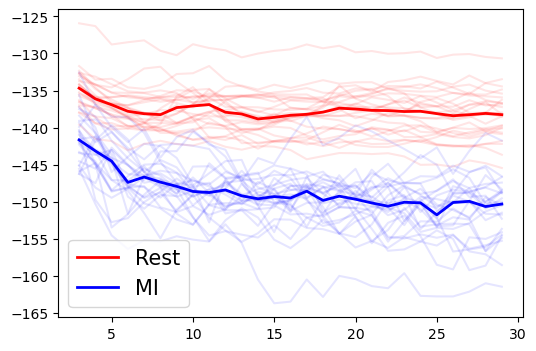

In [ ]:
fig, ax = plt.subplots(1, 1,figsize=(6, 4))

col_rs1 = "#0571b0"
col_mi = "#ca0020"

for i in range(26):
    ax.plot(fvec, 10*np.log10((strat1_rest2)[i, 66 ,3:30]),color='red',alpha=0.1)
spectra_eeg_rs1 = 10*np.log10(np.median(((strat1_rest2)[:, 66 ,3:30]),axis=0))
ax.plot(fvec,spectra_eeg_rs1,color='red',label='Rest',linewidth=2)    


for i in range(26):
    ax.plot(fvec, 10*np.log10((strat1_mi2)[i, 66 ,3:30]),color='blue',alpha=0.1)
spectra_eeg_mi = 10*np.log10(np.median(((strat1_mi2)[:, 66 ,3:30]),axis=0))
ax.plot(fvec,spectra_eeg_mi,color='blue',label='MI',linewidth=2)
ax.legend(fontsize=15)

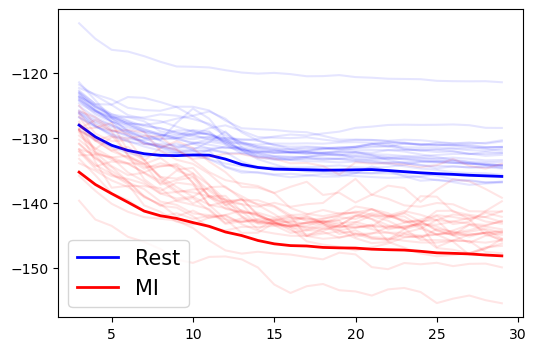

In [27]:
fig, ax = plt.subplots(1, 1, figsize=(6, 4))

col_rs1 = "blue"
col_mi = "red"

for i in range(26):
    mean_region_spectrum_rs1 = 10*np.log10(np.mean((strat1_rest2[i, :, 3:30]), axis=0))
    ax.plot(fvec, mean_region_spectrum_rs1, color=col_rs1, alpha=0.1)

spectra_eeg_rs1 = 10*np.log10(np.median((strat1_rest2[:, :, 3:30]), axis=(0,1)) ) 
ax.plot(fvec, spectra_eeg_rs1, color=col_rs1, label='Rest', linewidth=2)


for i in range(26):
    mean_region_spectrum_mi = 10*np.log10(np.mean((strat1_mi2[i, :, 3:30]), axis=0))
    ax.plot(fvec, mean_region_spectrum_mi, color=col_mi, alpha=0.1)

spectra_eeg_mi = 10*np.log10(np.median((strat1_mi2[:, :, 3:30]), axis=(0,1)))  
ax.plot(fvec, spectra_eeg_mi, color=col_mi, label='MI', linewidth=2)

ax.legend(fontsize=15)


In [28]:
good_list=[1,8,9,16,17,19,25]
batch2=list(range(11,26))
batch2

[11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25]

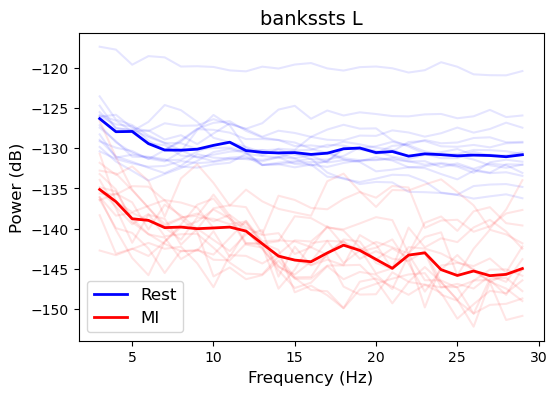

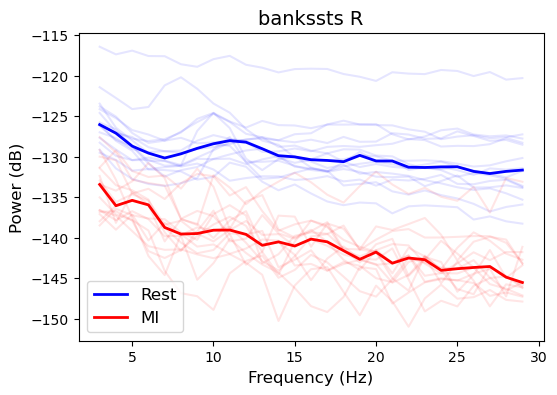

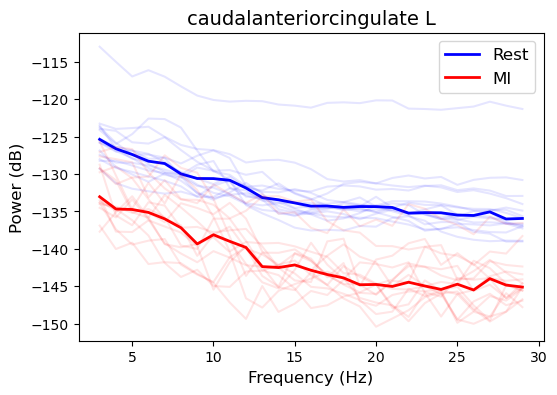

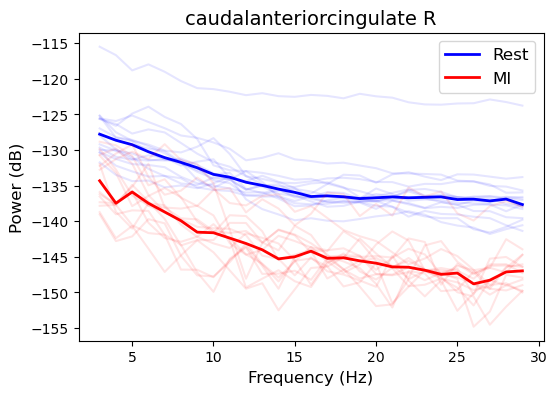

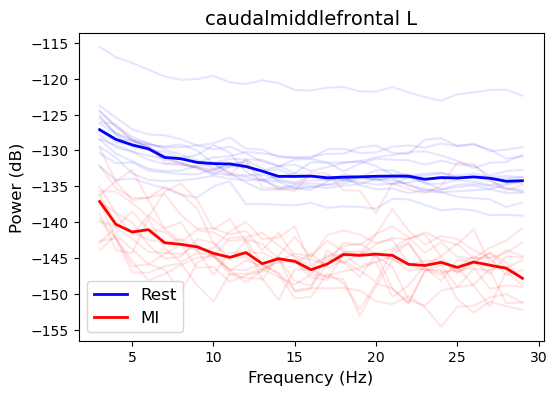

...

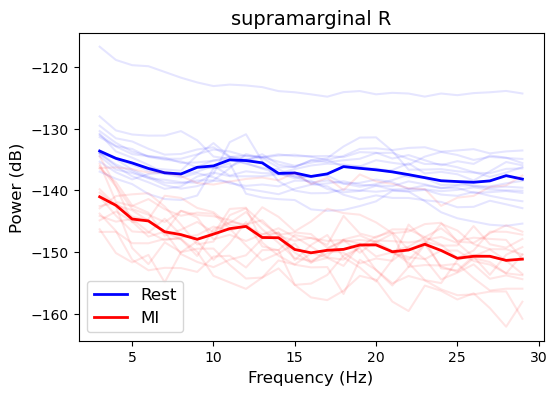

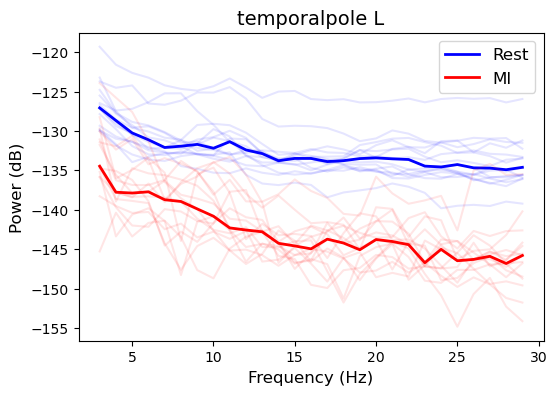

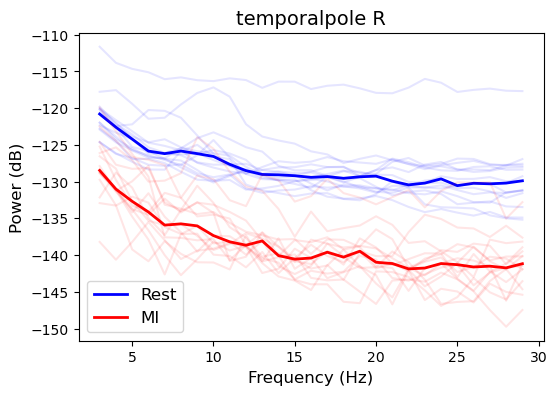

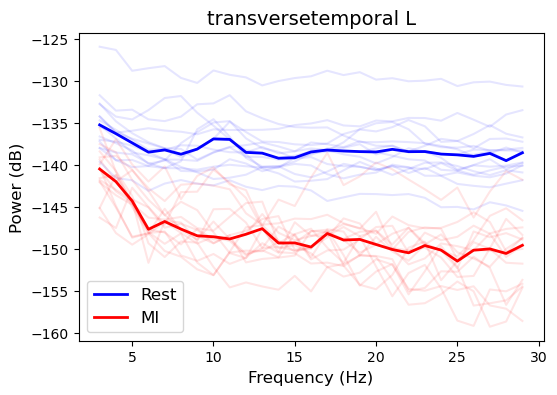

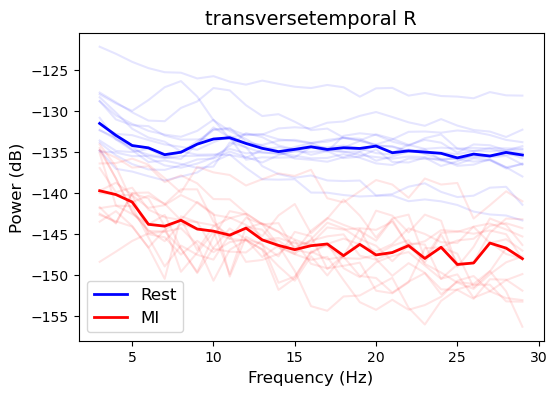

In [37]:
col_rs1 = "blue" 
col_mi = "red"  

for region in range(68):
    fig, ax = plt.subplots(1, 1, figsize=(6, 4))
    #individual spectra
    for i in range(15):
        ax.plot(fvec, 10*np.log10(strat1_rest2[batch2[i], region, 3:30]), color=col_rs1, alpha=0.1)
    #median spectrum
    spectra_eeg_rs1=10*np.log10(np.median((strat1_rest2[batch2, region, 3:30]), axis=0))
    ax.plot(fvec, spectra_eeg_rs1, color=col_rs1, label='Rest', linewidth=2)

    #individual spectra
    for i in range(15):
        ax.plot(fvec, 10*np.log10(strat1_mi2[batch2[i], region, 3:30]), color=col_mi, alpha=0.1)
    #median spectrum 
    spectra_eeg_mi=10*np.log10(np.median((strat1_mi2[batch2, region, 3:30]), axis=0))
    ax.plot(fvec, spectra_eeg_mi, color=col_mi, label='MI', linewidth=2)

    ax.set_title(f'{all_regions[region]}', fontsize=14)
    ax.set_xlabel('Frequency (Hz)', fontsize=12)
    ax.set_ylabel('Power (dB)', fontsize=12)
    ax.legend(fontsize=12)
    ax.grid(False)

    plt.show()


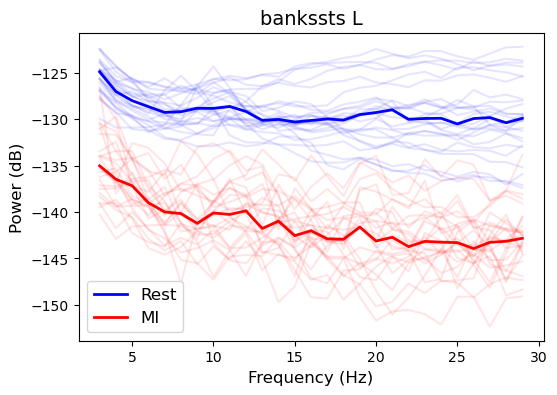

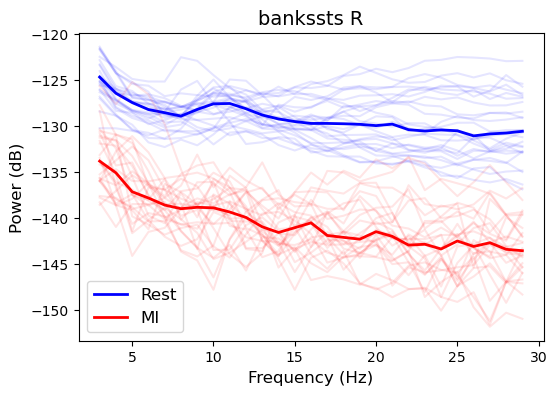

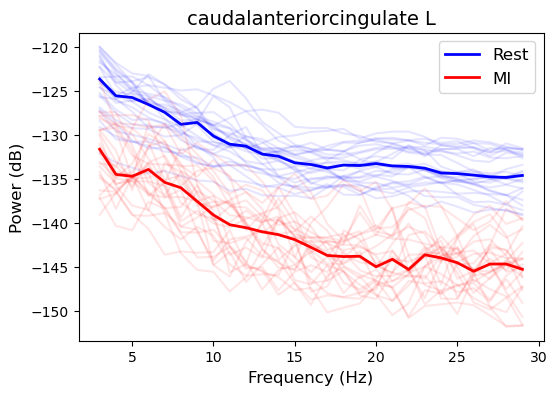

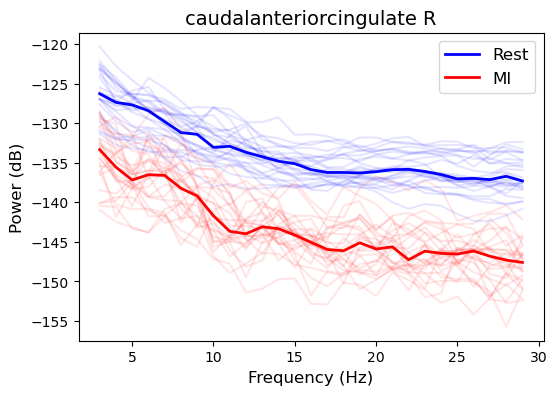

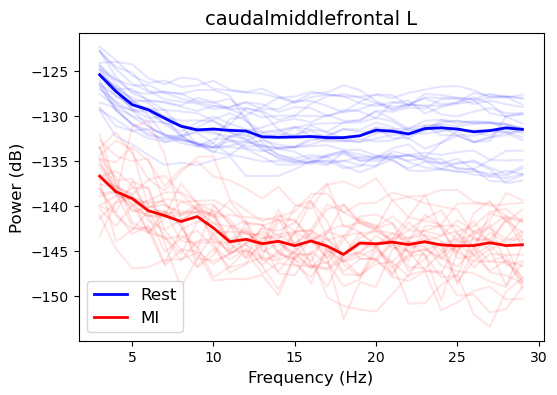

...

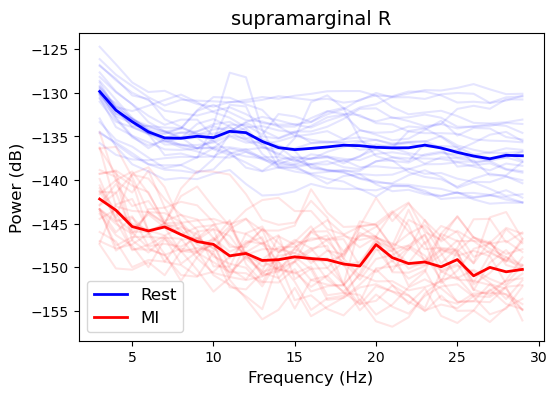

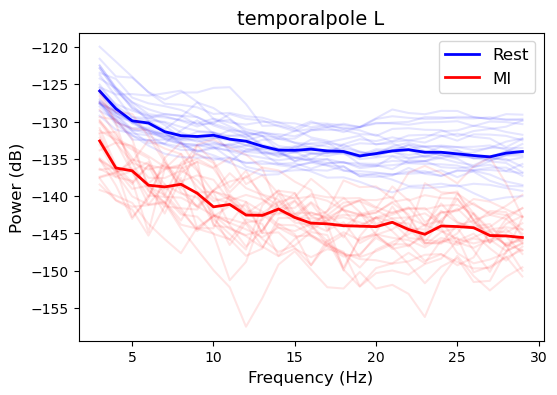

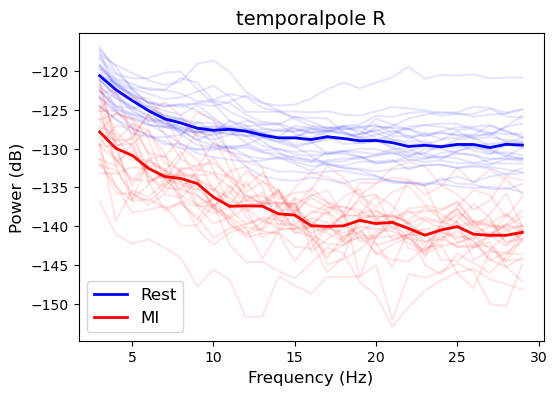

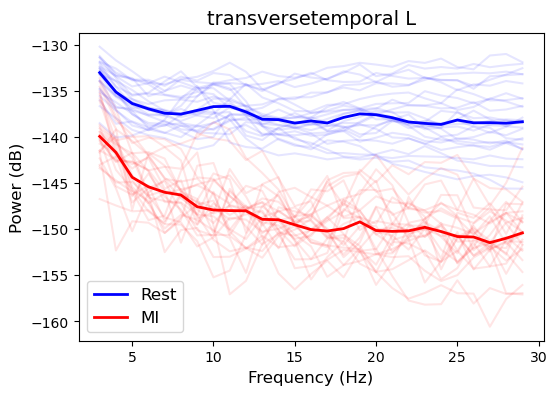

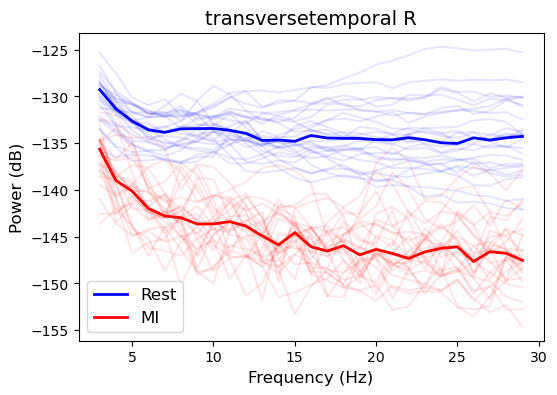

In [32]:
##strategy - 2
col_rs1 = "blue" 
col_mi = "red"  

for region in range(68):
    fig, ax = plt.subplots(1, 1, figsize=(6, 4))
    #individual spectra
    for i in range(26):
        ax.plot(fvec, 10*np.log10(strat2_rest2[i, region, 3:30]), color=col_rs1, alpha=0.1)
    #median spectrum
    spectra_eeg_rs1 = 10*np.log10(np.median((strat2_rest2[:, region, 3:30]), axis=0))
    ax.plot(fvec, spectra_eeg_rs1, color=col_rs1, label='Rest', linewidth=2)

    #individual spectra
    for i in range(26):
        ax.plot(fvec, 10*np.log10(strat2_mi2[i, region, 3:30]), color=col_mi, alpha=0.1)
    #median spectrum 
    spectra_eeg_mi = 10*np.log10(np.median((strat2_mi2[:, region, 3:30]), axis=0))
    ax.plot(fvec, spectra_eeg_mi, color=col_mi, label='MI', linewidth=2)

    ax.set_title(f'{all_regions[region]}', fontsize=14)
    ax.set_xlabel('Frequency (Hz)', fontsize=12)
    ax.set_ylabel('Power (dB)', fontsize=12)
    ax.legend(fontsize=12)
    ax.grid(False)

    plt.show()


In [179]:
def find_spectra(data, region_idx):
    median_spectra=[]
    ind_spectra=[]
    for idx in region_idx:
        sub_data=data[:,idx, 3:30] 
        median_spectrum=np.median(sub_data, axis=0)  
        ind_spectrum=sub_data
        median_spectra.append(median_spectrum)
        ind_spectra.append(ind_spectrum)
    return np.array(10*np.log10(median_spectra)), np.array(10*np.log10(ind_spectra)) ##in dB scale

def plot_all_exp_base(freq, session, median_mi, individual_mi, median_rs, individual_rs, region_idx):
    tot_regions=len(region_idx)
    cols=3 
    rows=(tot_regions+cols-1)//cols
    
    fig, axes=plt.subplots(rows, cols, figsize=(15, 3*rows))
    axes=axes.flatten()  
    for i in region_idx:
        for spectrum in individual_mi[i]:
            axes[i].plot(freq, spectrum, color='blue', alpha=0.1, zorder=1)
        axes[i].plot(freq, median_mi[i], label=f'{session} median MI', color='blue', linewidth=2.5, zorder=2)

        for spectrum in individual_rs[i]:
            axes[i].plot(freq, spectrum, color='green', alpha=0.1, zorder=1)
        axes[i].plot(freq, median_rs[i], label=f'{session} median RS', color='green', linewidth=2.5, zorder=2)
        
        # axes[i].set_title(f'{idx}')
        axes[i].legend()
        axes[i].grid(False)
    
    for ax in axes.flat:
        ax.set_xlabel('Frequency (Hz)')
        ax.set_ylabel('PSD (dB)')
    
    plt.tight_layout()
    plt.show()
